# TreeSAT AI Visualization and Analysis
The *.GeoJSON files provide geospatial characteristics for each tile, including polygon coordinates, a unique image ID, and detailed and rich information on 20 tree species. The data spans 9 years and can serve as potential training data.

The dataset is derived from aerial imagery and Sentinel-1 and Sentinel-2 satellite data covering German forests. It contains 50,381 image triplets (aerial, Sentinel-1, and Sentinel-2), with 20 tree species categories (single-label), 12 age categories (single-label), and 15 genus categories (multi-label). The data is available in both GeoTIFF and GeoJSON formats, with a fixed split of 90% for training and 10% for testing. Additionally, the label file (TreeSatBA_v9_60m_multi_labels.json) provides the probability distribution of tree species for each region.

In [3]:
"""
reading .geojson
explore ways for visualization for smaller, regional, detailed polygon area(60m*60m) analysis
"""
import geopandas as gpd
import matplotlib.pyplot as plt
import json
import rasterio
import numpy as np
import os

In [2]:
# from google.colab import drive
# drive.mount('/content/drive')
# """
# loading file using gpd
# Files could be accessed from here: 
# https://drive.google.com/drive/folders/1Oxe9bRiSsUCpS92c0p1aDOKeXMMs9KCo?usp=share_link
# """
# geojson_file = "drive/MyDrive/colab_projects/thesis/dataset_exploration/treesatai/src/bb_60m.GeoJSON"  # 替换为你的文件路径
# data = gpd.read_file(geojson_file)
# data.head()

### Columns

In [3]:
"""
loading file using gpd
"""
geojson_file = "../src/geojson/bb_60m.GeoJSON"  # 替换为你的文件路径
data = gpd.read_file(geojson_file)
data.head()

,IMG_ID,ID,BT_DEU,BT_ENG,BT_BOT,BT_GEN,AKL,SOURCE,l0,l1,l2,l3,YEAR,SPLIT,geometry
0,Fagus_sylvatica_7_138225_BI_NLF,138225,Bu,European beech,Fagus sylvatica,Fagus,7,BI_NLF,forest,broadleaf,beech,european beech,2018,train,"POLYGON ((579925.759 5756765.863, 579925.759 5..."
1,Fagus_sylvatica_7_138342_BI_NLF,138342,Bu,European beech,Fagus sylvatica,Fagus,7,BI_NLF,forest,broadleaf,beech,european beech,2018,train,"POLYGON ((579825.8 5756865.824, 579825.8 57568..."
2,Fagus_sylvatica_7_138464_BI_NLF,138464,Bu,European beech,Fagus sylvatica,Fagus,7,BI_NLF,forest,broadleaf,beech,european beech,2018,test,"POLYGON ((579725.841 5756965.784, 579725.841 5..."
3,Picea_abies_4_138466_BI_NLF,138466,Fi,Spruce,Picea abies,Picea,4,BI_NLF,forest,needleleaf,spruce,norway spruce,2018,train,"POLYGON ((579925.761 5756965.783, 579925.761 5..."
4,Acer_pseudoplatanus_7_138484_BI_NLF,138484,BAh,Sycamore maple,Acer pseudoplatanus,Acer,7,BI_NLF,forest,broadleaf,long-lived deciduous,sycamore maple,2018,train,"POLYGON ((599517.913 5756965.604, 599517.913 5..."


In [4]:
data.crs

<Projected CRS: EPSG:25832>
Name: ETRS89 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Europe between 6°E and 12°E: Austria; Belgium; Denmark - onshore and offshore; Germany - onshore and offshore; Norway including - onshore and offshore; Spain - offshore.
- bounds: (6.0, 38.76, 12.01, 84.33)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: European Terrestrial Reference System 1989 ensemble
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [5]:
data.columns

Index(['IMG_ID', 'ID', 'BT_DEU', 'BT_ENG', 'BT_BOT', 'BT_GEN', 'AKL', 'SOURCE',
       'l0', 'l1', 'l2', 'l3', 'YEAR', 'SPLIT', 'geometry'],
      dtype='object')

### Dataset Analysis
The year of 2018 and 2015 seem to be well balanced and have sufficient amount of data points.

In [6]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

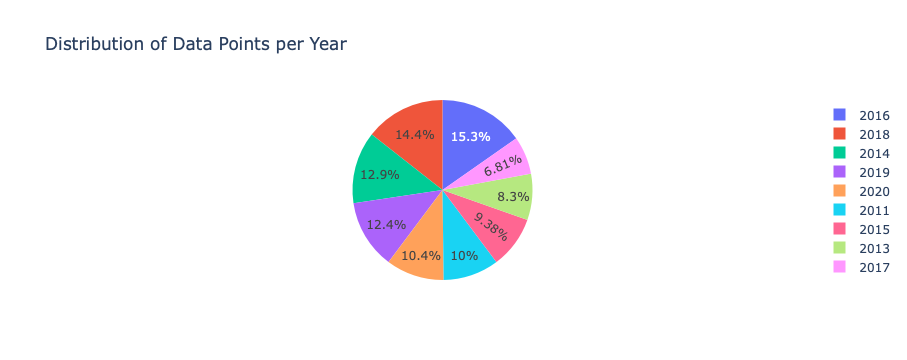

In [7]:
yearly_counts = data['YEAR'].value_counts()

fig = go.Figure(data=[go.Pie(labels=yearly_counts.index, values=yearly_counts.values)])
fig.update_layout(title_text="Distribution of Data Points per Year")
fig.show()

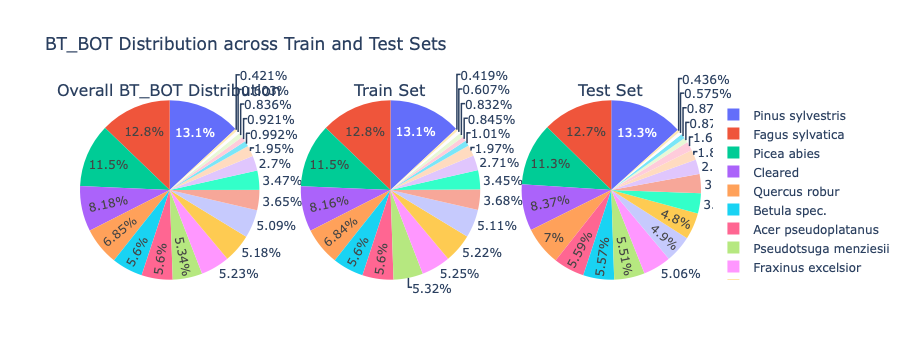

In [8]:
"""
check whether the data is balanced overall
"""
# Count occurrences of BT_BOT values for each split
train_counts = data[data['SPLIT'] == 'train']['BT_BOT'].value_counts()
test_counts = data[data['SPLIT'] == 'test']['BT_BOT'].value_counts()

# Create subplots
fig = make_subplots(rows=1, cols=3, specs=[[{'type':'domain'}, {'type':'domain'}, {'type':'domain'}]],
                    subplot_titles=['Overall BT_BOT Distribution', 'Train Set', 'Test Set'])

# Overall BT_BOT distribution
fig.add_trace(go.Pie(labels=data['BT_BOT'].value_counts().index,
                     values=data['BT_BOT'].value_counts().values,
                     name="Overall BT_BOT"), 1, 1)

# Train Set BT_BOT distribution
fig.add_trace(go.Pie(labels=train_counts.index,
                     values=train_counts.values,
                     name="Train Set"), 1, 2)


# Test Set BT_BOT distribution
fig.add_trace(go.Pie(labels=test_counts.index,
                     values=test_counts.values,
                     name="Test Set"), 1, 3)

fig.update_traces(hole=0) # Ensure it's a pie chart, not a donut
fig.update_layout(title_text="BT_BOT Distribution across Train and Test Sets")

fig.show()

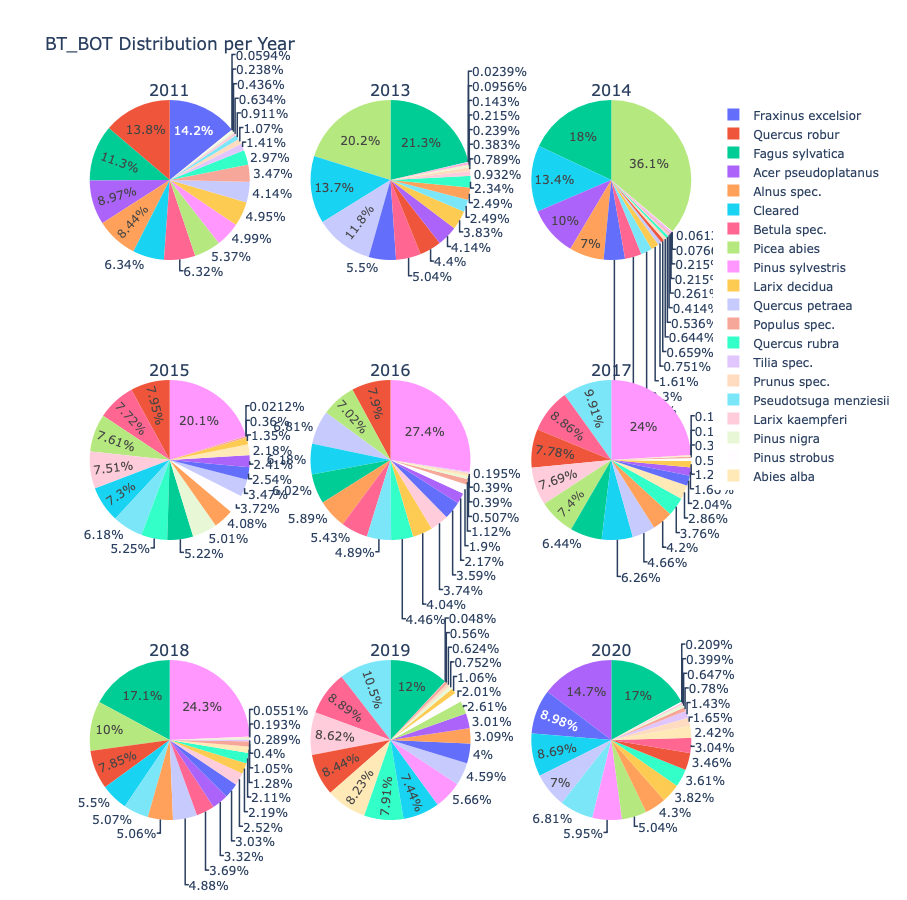

In [9]:
"""
check whether the data is balanced on a yearly basis
"""
years = sorted(data['YEAR'].unique())
num_years = len(years)

fig = make_subplots(rows=int(num_years**0.5), cols=int(num_years**0.5), specs=[[{'type':'domain'}]*int(num_years**0.5)]*int(num_years**0.5),
                    subplot_titles=[str(year) for year in years])

row = 1
col = 1
for year in years:
  year_data = data[data['YEAR'] == year]
  bt_bot_counts = year_data['BT_BOT'].value_counts()

  fig.add_trace(go.Pie(labels=bt_bot_counts.index, values=bt_bot_counts.values, name=str(year)), row, col)

  col += 1
  if col > int(num_years**0.5):
      col = 1
      row +=1

fig.update_traces(hole=0)
fig.update_layout(title_text="BT_BOT Distribution per Year", height=900, width=800)  # Adjust height and width

fig.show()

### Using folium to Visualize

In [10]:
import geopandas as gpd
import folium
from IPython.display import display
# change coordinates into WGS84 (EPSG:4326), for Folium
data = data.to_crs(epsg=4326)
# initialize the map
centroid = data.geometry.union_all().centroid
center_coords = [centroid.y, centroid.x]

In [11]:
class YearlyVisualizer:
    def __init__(self, data, year, center_coords):
        self.data = data
        self.year = year
        self.map = folium.Map(location=center_coords, zoom_start=14)

    def style_function(self, feature):
        return {
            "fillColor": "orange",
            "color": "black",
            "weight": 1,
            "fillOpacity": 0.6,
        }

    def get_coordinates(self, feature):
        # polygon exterior
        coords = list(feature["geometry"].exterior.coords) # Changed to access coordinates
        return "<br>".join([f"({round(c[0], 3)}, {round(c[1], 3)})" for c in coords])

    def add_geojson(self):
        filtered_data = self.data[self.data["YEAR"] == self.year]
        filtered_data["Coordinates"] = filtered_data.apply(self.get_coordinates, axis=1) # Corrected the apply function

        geojson_filtered = folium.GeoJson(
            filtered_data,
            name="Filtered Polygons",
            style_function=self.style_function,  # Use the regular function here
            tooltip=folium.GeoJsonTooltip(
                fields=["ID", "BT_ENG", "YEAR", "Coordinates"],  # Include Coordinates field here
                aliases=["ID", "Species", "Year", "Coordinates"],
                localize=True,
                sticky=False,
            ),
        )

        geojson_filtered.add_to(self.map)


In [12]:
visualizer_18 = YearlyVisualizer(data, "2018", center_coords)  # Instantiate with the desired year
visualizer_18.add_geojson()
visualizer_18.map

/Users/siyux1927/.micromamba/envs/myenv/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [13]:
visualizer_15 = YearlyVisualizer(data, "2015", center_coords)  # Instantiate with the desired year
visualizer_15.add_geojson()
visualizer_15.map

/Users/siyux1927/.micromamba/envs/myenv/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Balance over Area

In [14]:
def BT_distribution(year):
  data_y = data[data['YEAR'] == year]

  data_y['centroid'] = data_y['geometry'].centroid
  x = data_y['centroid'].x
  y = data_y['centroid'].y

  plt.figure(figsize=(8, 6))

  # for bt_bot_type, group in data_2018.groupby('BT_BOT'):
  #     plt.scatter(group['centroid'].x, group['centroid'].y, label=bt_bot_type, s=0.1)
  for bt_bot_type, group in data_y.groupby('BT_BOT'):
      plt.scatter(group['centroid'].x, group['centroid'].y, label=bt_bot_type, s=50, alpha=0.1)

  plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
  plt.title('Distribution of BT_BOT in 2018')
  plt.xlabel('Longitude')
  plt.ylabel('Latitude')

  plt.show()

/var/folders/lc/dyf1189n18nbc2v9sbwx72740000gn/T/ipykernel_94874/3165870031.py:4: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/Users/siyux1927/.micromamba/envs/myenv/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



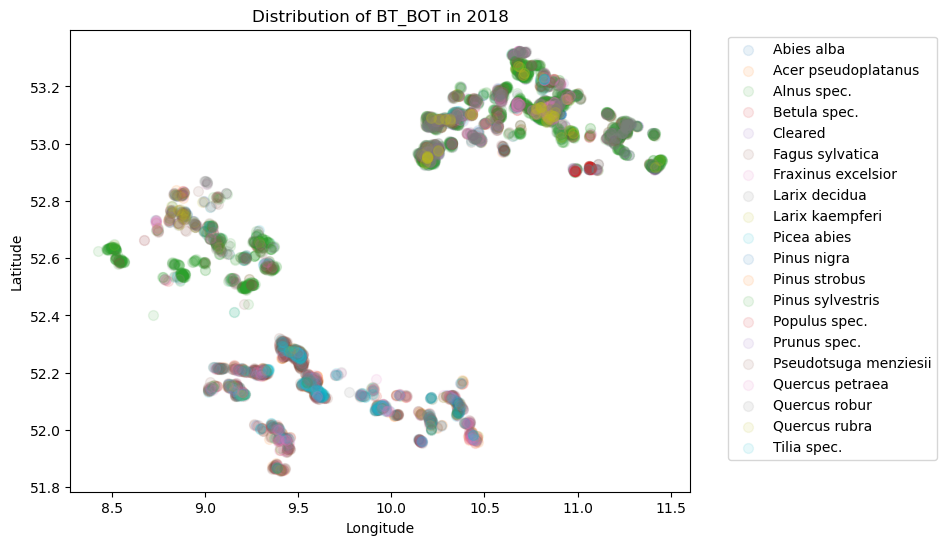

In [15]:
BT_distribution('2018')

/var/folders/lc/dyf1189n18nbc2v9sbwx72740000gn/T/ipykernel_94874/3165870031.py:4: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/Users/siyux1927/.micromamba/envs/myenv/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



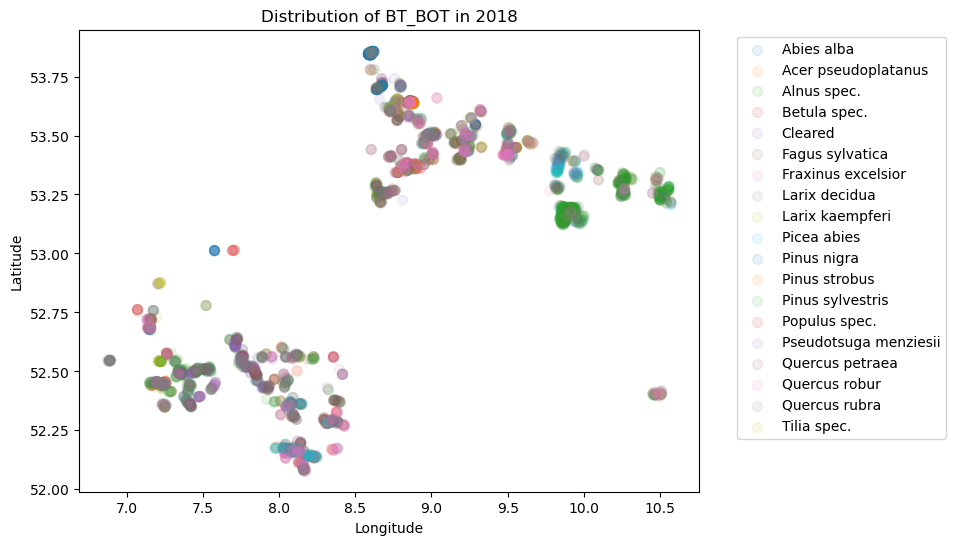

In [16]:
BT_distribution('2015')